# Associating world music features by country to social aspects

## Preprocessing the data

#### Loading the datasets and importing the necessary modules.
For this project I'll use datasets, but 

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

df_coun = pd.read_csv('countries_codes_and_coordinates.csv') # Assign df_coun for df_countries.
df_hpy = pd.read_csv('Happiness.csv', sep=';') # Assign df_hpy for df_happiness.
df_aufe = pd.read_csv('Top-50-Oct-Jan.csv') # Assign df_aufe for df_audio_features.

print(df_coun.head())
print(df_hpy.head())
print(df_aufe.head())

          Country Alpha-2 code Alpha-3 code Numeric code Latitude (average)  \
0     Afghanistan         "AF"        "AFG"          "4"               "33"   
1   Åland Islands         "AX"        "ALA"        "248"        "60.116667"   
2         Albania         "AL"        "ALB"          "8"               "41"   
3         Algeria         "DZ"        "DZA"         "12"               "28"   
4  American Samoa         "AS"        "ASM"         "16"         "-14.3333"   

  Longitude (average)  
0                "65"  
1              "19.9"  
2                "20"  
3                 "3"  
4              "-170"  
  Country name Ladder score Standard error of ladder score upperwhisker  \
0      Finland        7,804                          0,036        7,875   
1      Denmark        7,586                          0,041        7,667   
2      Iceland        7,530                          0,049        7,625   
3       Israel        7,473                          0,032        7,535   
4  Net

C:\Users\user\AppData\Local\Temp\ipykernel_1324\2491768020.py:8: DtypeWarning: Columns (8) have mixed types. Specify dtype option on import or set low_memory=False.
  df_aufe = pd.read_csv('Top-50-Oct-Jan.csv') # Assign df_aufe for df_audio_features.


#### We want to keep the same ISO 3166-1 Alpha-3 nomenclature in all datasets.
The data downloaded from the happiness report has the countries named in English in the column "Country name". I want to change this into the ISO 3166-1 Alpha-3 code to match the df_aufe "Country" column.

To achieve that, I will use the .csv file uploaded by the user tadast to Github (https://gist.github.com/tadast/8827699), which is loaded as df_coun.

In [2]:
df_coun['Alpha-3 code'] = df_coun['Alpha-3 code'].str.replace('"', '') # We remove the ticks around the Alpha-3 code.

# We iterate over the rows in df_hpy to replace the actual full country name with its own Aplha-3 code
for i, row in df_hpy.iterrows():
    ind_coun = df_coun[df_coun['Country'] == row['Country name']].index
    if not ind_coun.empty:
        alpha_3_code = df_coun.loc[ind_coun[0], 'Alpha-3 code']
        df_hpy.at[i, 'Country name'] = alpha_3_code

print(df_hpy['Country name'].unique())

[' FIN' ' DNK' ' ISL' ' ISR' ' NLD' ' SWE' ' NOR' ' CHE' ' LUX' ' NZL'
 ' AUT' ' AUS' ' CAN' ' IRL' ' USA' ' DEU' ' BEL' 'Czechia' ' GBR' ' LTU'
 ' FRA' ' SVN' ' CRI' ' ROU' ' SGP' ' ARE' 'Taiwan Province of China'
 ' URY' ' SVK' ' SAU' ' EST' ' ESP' ' ITA' ' XKX' ' CHL' ' MEX' ' MLT'
 ' PAN' ' POL' ' NIC' ' LVA' ' BHR' ' GTM' ' KAZ' ' SRB' ' CYP' ' JPN'
 ' HRV' ' BRA' ' SLV' ' HUN' ' ARG' ' HND' ' UZB' ' MYS' ' PRT' ' KOR'
 ' GRC' ' MUS' ' THA' ' MNG' ' KGZ' 'Moldova' ' CHN' ' VNM' ' PRY' ' MNE'
 ' JAM' ' BOL' ' RUS' ' BIH' ' COL' ' DOM' ' ECU' ' PER' ' PHL' ' BGR'
 ' NPL' ' ARM' ' TJK' ' DZA' 'Hong Kong S.A.R. of China' ' ALB' ' IDN'
 ' ZAF' 'Congo (Brazzaville)' 'North Macedonia' ' VEN' 'Laos' ' GEO'
 ' GIN' ' UKR' ' CIV' ' GAB' ' NGA' ' CMR' ' MOZ' ' IRQ'
 'State of Palestine' ' MAR' 'Iran' ' SEN' ' MRT' ' BFA' ' NAM' 'Turkiye'
 ' GHA' ' PAK' ' NER' ' TUN' ' KEN' ' LKA' ' UGA' ' TCD' ' KHM' ' BEN'
 ' MMR' ' BGD' ' GMB' ' MLI' ' EGY' ' TGO' ' JOR' ' ETH' ' LBR' ' IND'
 ' MDG' ' ZMB'

Once we are done with the ISO 3166-1 Alpha-3 codes we check that they are all correct. Manually, we finish editing the codes not changed like 'HongKongS.A.R.ofChina', 'NorthMacedonia' or the space before the code.

In [3]:
df_hpy['Country name'] = df_hpy['Country name'].str.replace(" ", "") # We remove the first space.

country_mapping = {
    'Czechia': 'CZE',
    'NorthMacedonia': 'MKD',
    'Moldova': 'MDA',
    'HongKongS.A.R.ofChina': 'HKG',
    'Congo(Brazzaville)': 'COG',
    'Turkiye': 'TUR',
    'Iran': 'IRN'
}

df_hpy['Country name'] = df_hpy['Country name'].replace(country_mapping)


### Create the dataset with the final data we'll use
First, we are going to select the columns we will use in the final dataset to analyze the results. 

In [4]:
print(df_aufe.columns.tolist())
# Selection of columns from df_aufe for the final dataset.
df_aufe_col = ['Country', 'Track Name', 'Artist Name', 'Popularity', 'Danceability', 'Acousticness', 'duration', 'Energy', 'Key', 'Liveness', 'Loudness', 'Mode', 'Speechiness', 'Tempo', 'TSignature', 'Positiveness']

print(df_hpy.columns.tolist())
# Selection of columns from the df_hpy for the final dataset.
df_hpy_col = ['Country name', 'Ladder score', 'Logged GDP per capita', 'Healthy life expectancy']

['Unnamed: 0.1', 'Unnamed: 0', 'Country', 'Track Name', 'Artist Name', 'Album Name', 'Popularity', 'Date', 'Markets', 'Danceability', 'Acousticness', 'duration', 'Energy', 'Instrumentalness', 'Key', 'Liveness', 'Loudness', 'Mode', 'Speechiness', 'Tempo', 'TSignature', 'Positiveness', 'Weeknum']
['Country name', 'Ladder score', 'Standard error of ladder score', 'upperwhisker', 'lowerwhisker', 'Logged GDP per capita', 'Social support', 'Healthy life expectancy', 'Freedom to make life choices', 'Generosity', 'Perceptions of corruption', 'Ladder score in Dystopia', 'Explained by: Log GDP per capita', 'Explained by: Social support', 'Explained by: Healthy life expectancy', 'Explained by: Freedom to make life choices', 'Explained by: Generosity', 'Explained by: Perceptions of corruption', 'Dystopia + residual']


#### Now that we have chosen the columns we want for our analysis, it is time to create the DataFrame.

We start by creating  a new df called df_prob with all the values we want from the initial df_aufe. Also, the values in df_aufe corresponding to the Global Top-50 are going to be discarded because we want to focus just on countries. 

Then, this df is going to be merged with the so initial df_hpy on the 'Country name' column that we previously adapted to ISO 3166-1 Alpha-3 to ease this merging step.

In [5]:
df_prob = df_aufe[df_aufe_col] # Create a new df with the columns selected of df_aufe.
df_prob = df_prob[df_prob['Country'] != 'Global'] # Drop all rows where the country is Global (Top-50 Global).

df_proj = pd.merge(df_prob, df_hpy[df_hpy_col], left_on='Country', right_on='Country name', how='left') # Do the join with df_hpy on the 'Country'.
df_proj['Country'] = df_proj['Country'].str.strip()
print(df_proj['Country'].unique())

# Change column names to make them easier to understand.
renamed = {'Ladder score' : 'Happiness', 'Logged GDP per capita' : 'GDP', 'Healthy life expectancy' : 'Lifexp'}
df_proj.rename(columns=renamed, inplace=True)

# Convert categorical columns to object (str).
column_categorical = ['TSignature', 'Key', 'Mode']
df_proj[column_categorical] = df_proj[column_categorical].astype(object)

# Drop the redundant 'Country name' column.
df_proj.drop(columns=['Country name'], inplace=True)

# Convert df_hpy columns to float64.
added_column = ['Happiness', 'GDP', 'Lifexp']
df_proj[added_column] = df_proj[added_column].replace(',', '.', regex= True).astype('float')

print(df_proj.head(-5))

['DEU' 'SAU' 'ARG' 'AUS' 'AUT' 'BLR' 'BRA' 'BGR' 'BEL' 'CAN' 'CHL' 'COL'
 'KOR' 'CRI' 'DNK' 'ARE' 'ECU' 'EGY' 'SLV' 'SVK' 'ESP' 'USA' 'EST' 'PHL'
 'FIN' 'FRA' 'GRC' 'GTM' 'HND' 'HKG' 'HUN' 'IND' 'IDN' 'IRL' 'ISL' 'ISR'
 'ITA' 'JPN' 'KAZ' 'CZE' 'DOM' 'LVA' 'LTU' 'NLD' 'LUX' 'MYS' 'MAR' 'MEX'
 'NIC' 'NGA' 'NOR' 'NZL' 'PAK' 'PAN' 'PRY' 'PER' 'POL' 'PRT' 'GBR' 'ROU'
 'SGP' 'ZAF' 'SWE' 'CHE' 'THA' 'TWN' 'TUR' 'UKR' 'URY' 'VEN' 'VNM' 'BOL']
      Country                        Track Name       Artist Name  Popularity  \
0         DEU                      Liebe Grüsse        RAF Camora          80   
1         DEU                       Si No Estás    iñigo quintero          99   
2         DEU  Vois sur ton chemin - Techno Mix           BENNETT          91   
3         DEU            Blonde Chaya - Sped up             Amaru          80   
4         DEU            2 Germans (feat. Gzuz)           Luciano          77   
...       ...                               ...               ...         .

The final df_proj is created: 43114 rows x 21 columns.

It's time to check if it has any outlier or aspect that can make the process difficult.
To check this fact, we will boxplot every numerical column in the df_proj and describe it.

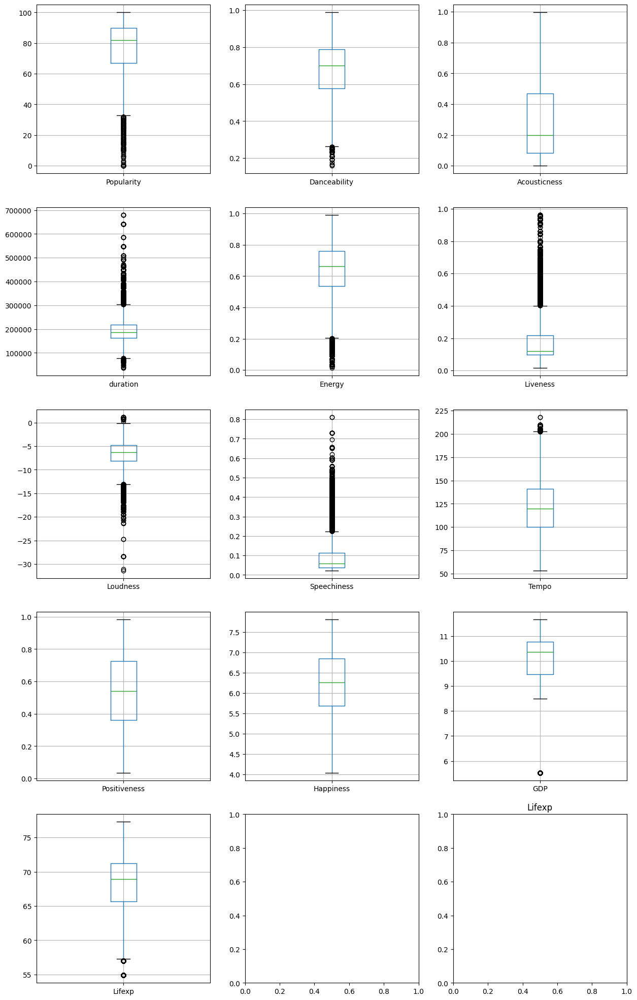

In [6]:
numeric_columns = df_proj.select_dtypes(include=['int64', 'float64']).columns.tolist()
num_rows = (len(numeric_columns) + 2) // 3 
fig, axes = plt.subplots(num_rows, 3, figsize=(15, 5*num_rows))
for i, column in enumerate(numeric_columns):
    ax = axes[i // 3, i % 3]
    df_proj.boxplot(column=column, ax=ax)
    plt.title(column)

In [7]:
df_proj.describe()

,Popularity,Danceability,Acousticness,duration,Energy,Liveness,Loudness,Speechiness,Tempo,Positiveness,Happiness,GDP,Lifexp
count,43119.000000,43119.000000,43119.000000,43119.000000,43119.000000,43119.000000,43119.000000,43119.000000,43119.000000,43119.000000,41869.000000,41869.000000,41869.000000
mean,77.888727,0.679268,0.293308,193960.689371,0.642786,0.175960,-6.644155,0.097907,122.398720,0.541500,6.213733,10.108871,68.030209
std,14.749091,0.143190,0.263149,49856.829442,0.165770,0.128941,2.722626,0.093017,28.700248,0.230195,0.820535,0.959099,4.188832
min,0.000000,0.159000,0.000008,36027.000000,0.012400,0.015400,-31.356000,0.023000,53.443000,0.034900,4.036000,5.527000,54.891000
25%,67.000000,0.578000,0.081450,162462.000000,0.537000,0.097400,-8.116000,0.038400,99.974000,0.363000,5.684000,9.478000,65.650000
50%,82.000000,0.700000,0.198000,187105.000000,0.662000,0.120000,-6.276000,0.058700,119.705000,0.541000,6.260000,10.353000,68.950000
75%,90.000000,0.788000,0.470000,219333.000000,0.759000,0.219000,-4.795000,0.113000,141.095000,0.726000,6.845000,10.773000,71.250000
max,100.000000,0.988000,0.996000,680816.000000,0.992000,0.963000,1.155000,0.811000,217.969000,0.983000,7.804000,11.660000,77.280000


### Replace outliers with the mean
As we see in the boxplots, there are some outlier values in each column. This values would bias our information because of its weight in calculating the mean or other variables. For this reason, these are going to be replaced by the mean of its country in that column. It will be only applied to music features, because the columns from the df_hpy are already reviewed and official. 

#### Outlier finding method: IQR 
To determine which values are outliers we are using the 1.5 * IQR method. This method says that a data point is an outlier if it is more than 1.5 ⋅ IQR ‍ above the q3 or below the q1.

#### For example:
Let's say we have an outlier in the positiveness column from a song of the Spanish chart. It will be replaced by the positiveness mean of Spanish songs.

In [8]:
outlier_columns = ['Popularity','Danceability','Acousticness', 'duration', 'Energy', 'Liveness', 'Loudness', 'Speechiness', 'Tempo', 'Positiveness']

# We iterate over every numerical column of the initial df_aufe to find outliers with IQR. For those outliers, we get the indexes in idx_outliers.
for column in outlier_columns:
    q1 = np.percentile(df_proj[column], 25)
    q3 = np.percentile(df_proj[column], 75)
    iqr = q3 - q1
    top_line = q3 + 1.5 * iqr
    bottom_line = q1 - 1.5 * iqr
    idx_outliers = df_proj.loc[(df_proj[column] > top_line) | (df_proj[column] < bottom_line)].index

    # We iterate over every outlier and replace it by the mean of its own country.
    for idx in idx_outliers:
        country = df_proj.at[idx, 'Country']
        country_mean = df_proj[df_proj['Country'] == country][column].mean()
        if df_proj[column].dtype == 'int64':
            df_proj.at[idx, column] = round(country_mean)
        else:
            df_proj.at[idx, column] = country_mean

In [9]:
df_proj.describe()

# We create a copy of the final dataset to make sure we don't get any information lost.
df_safety = df_proj.copy()

## Let's start the analysis
Now that we have the final df ready, it's time to start with the analysis. It will be based on the following question:

**Which music features are related to happiness?**

### Which are the top-10 countries for each feature?


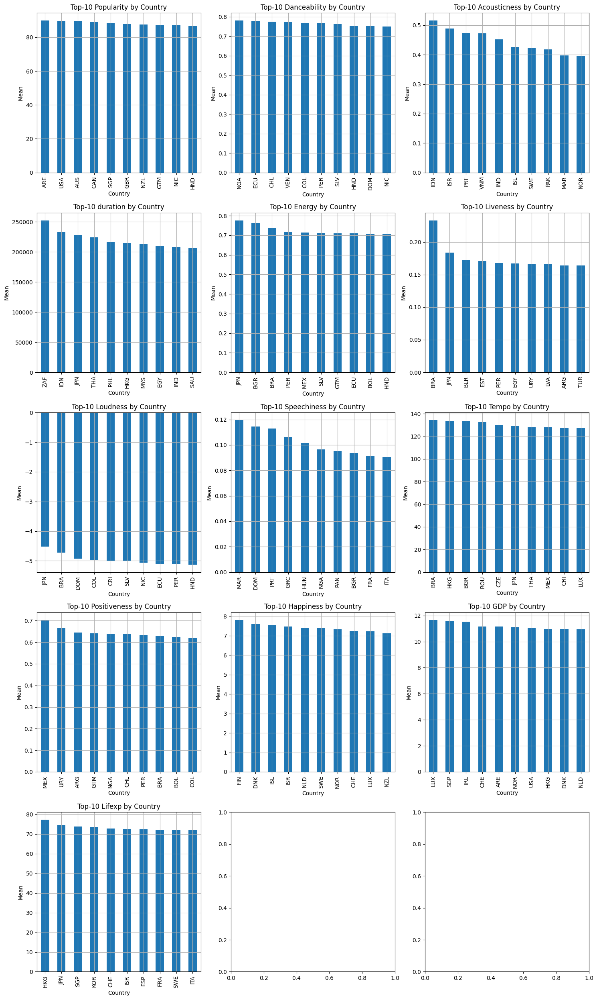

In [10]:
fig, axes = plt.subplots(num_rows, 3, figsize=(15, 5*num_rows))

for idx, column in enumerate(numeric_columns):
    df_grouped = df_proj.groupby('Country')[column].mean().sort_values(ascending = False)
    top_10_countries = df_grouped.head(10)
    ax = axes[idx // 3, idx % 3]
    top_10_countries.plot(kind='bar', ax=ax)
    ax.set_title(f'Top-10 {column} by Country')
    ax.set_xlabel('Country')
    ax.set_ylabel('Mean')
    ax.grid(True)
plt.tight_layout()
plt.show()

#### Now that we know the first countries for each music feature, let's see how related they are to happiness.

To check this, we'll create scatterplots comparing every audio feature to the happiness column to try to find correlations. In these scatterplots every point will be a country, the x-axis will be the happiness and the y-axis will be the mean value for that feature.

In [11]:
# We create a copy of the df_proj without categorical columns to get the mean values of each feature.
df_without_songs_artists = df_proj.copy()
df_without_songs_artists.drop(['Artist Name', 'Track Name'], axis=1, inplace=True)
df_without_songs_artists = df_without_songs_artists.groupby('Country').mean()

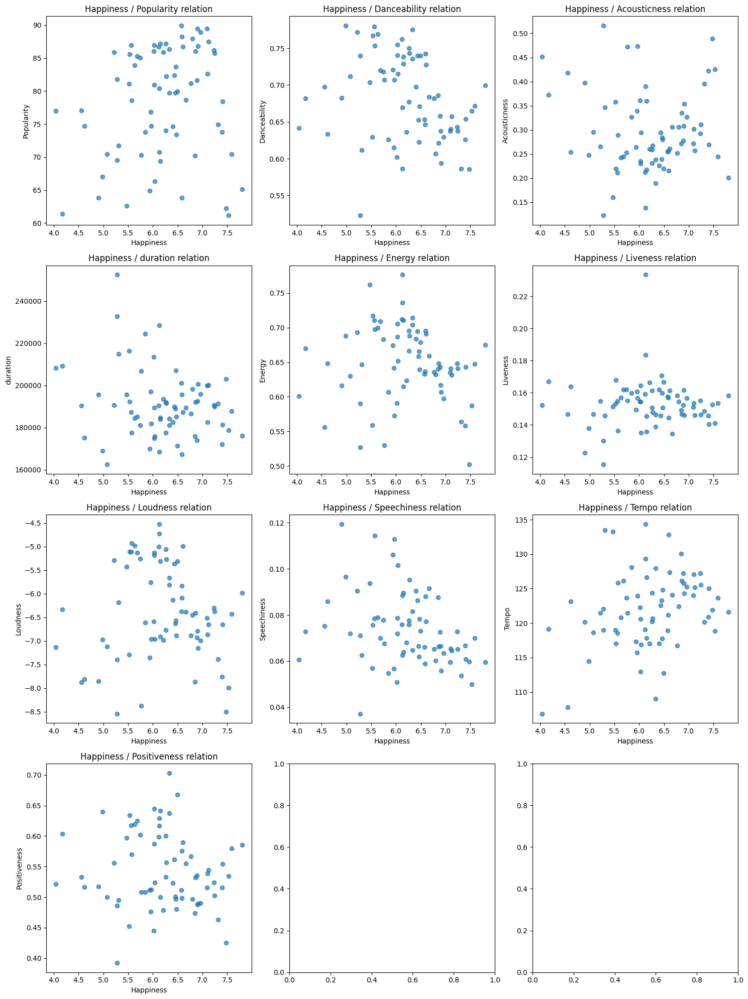

In [12]:
columns_to_remove = ['Happiness', 'GDP', 'Lifexp']
[numeric_columns.remove(column) for column in columns_to_remove if column in numeric_columns]

num_rows = len(numeric_columns) // 3 + (1 if len(numeric_columns) % 3 > 0 else 0)
fig, axes = plt.subplots(num_rows, 3, figsize=(15, 5*num_rows))

for idx, column in enumerate(numeric_columns):
    ax = axes[idx // 3, idx % 3]
    ax.scatter(df_without_songs_artists['Happiness'], df_without_songs_artists[column], alpha=0.7)
    ax.set_title(f'Happiness / {column} relation')
    ax.set_xlabel('Happiness')
    ax.set_ylabel(column)
plt.tight_layout()
plt.show()

#### Any music feature is clearly related to the happiness score.
Analysing the scatterplots we determine that any feature is directly related to the happiness score, at least at a first sight. However, there are many other ways to get more specific correlations.

In the next step we are analysing the correlation matrix between all the features, focusing on the last 3 rows ('Happiness', 'GDP' and 'Lifexp').

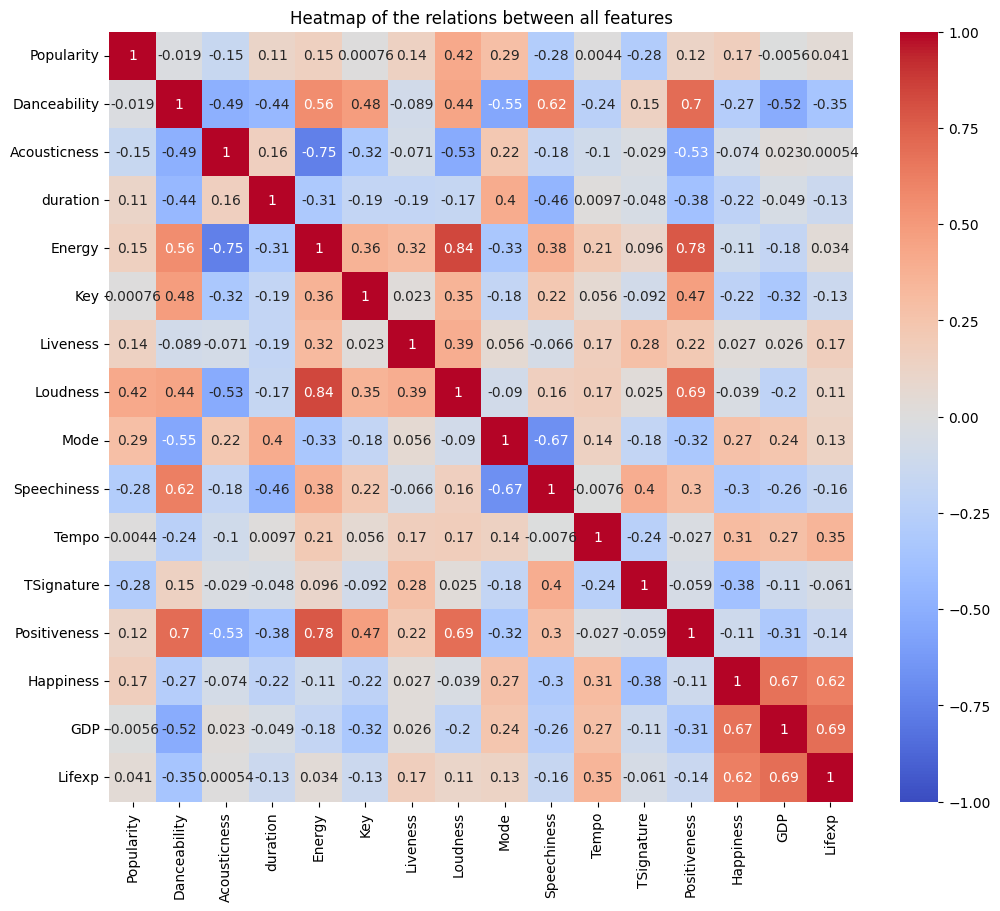

In [13]:
corr_matrix = df_without_songs_artists.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap= 'coolwarm', vmin=-1, vmax=1)
plt.title('Heatmap of the relations between all features')
plt.show()

#### Happy countries tend to use music with a high tempo, and poor countries listen to music with high danceability.

There are some of the greatest (positive and negative) correlations between music features and social aspects of countries. 

· **Happiness**: Higher --> Tempo (0.31) | Lower --> Time Signature (-0.38)

· **GDP**:       Higher --> Tempo (0.27) | Lower --> Danceability (-0.52)

· **Lifexp**:    Higher --> Tempo (0.35) | Lower --> Danceability (-0.35)

Let's plot some jointplots to see the relationship between the most and the less related music features to all of the three music aspects.

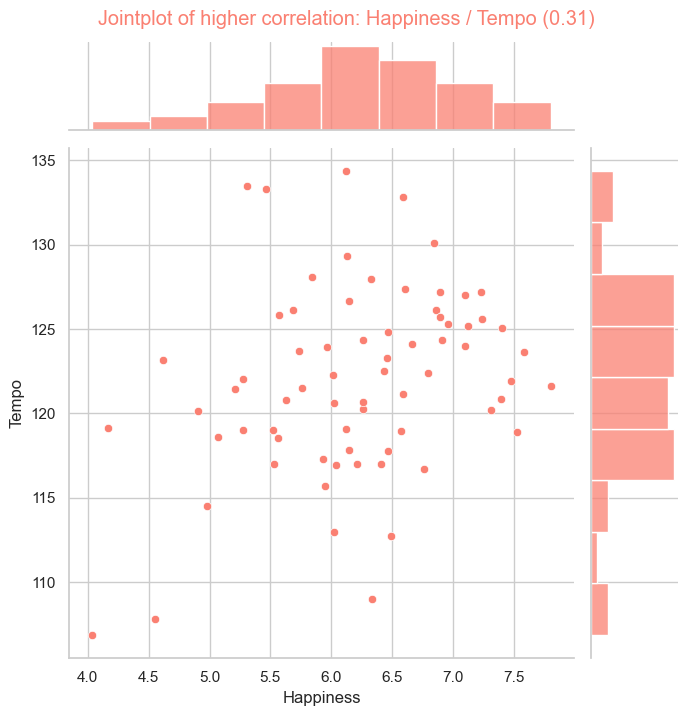

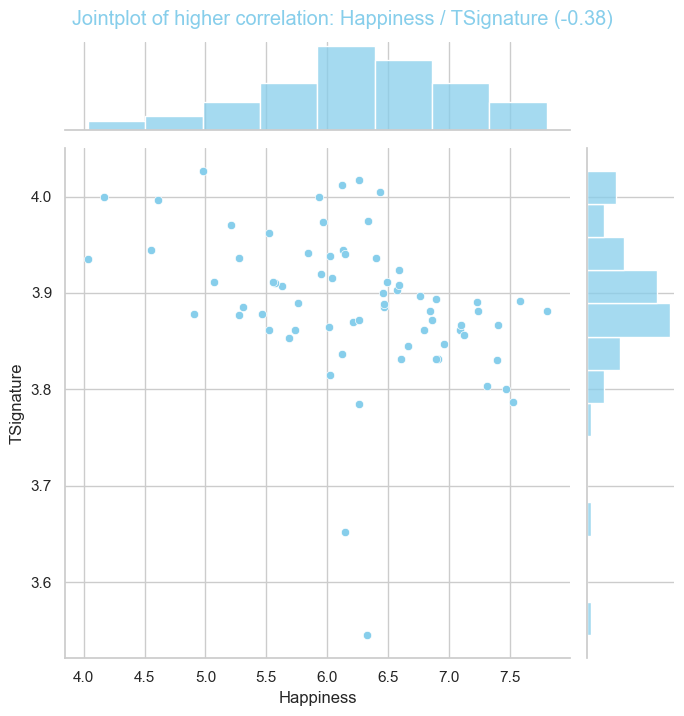

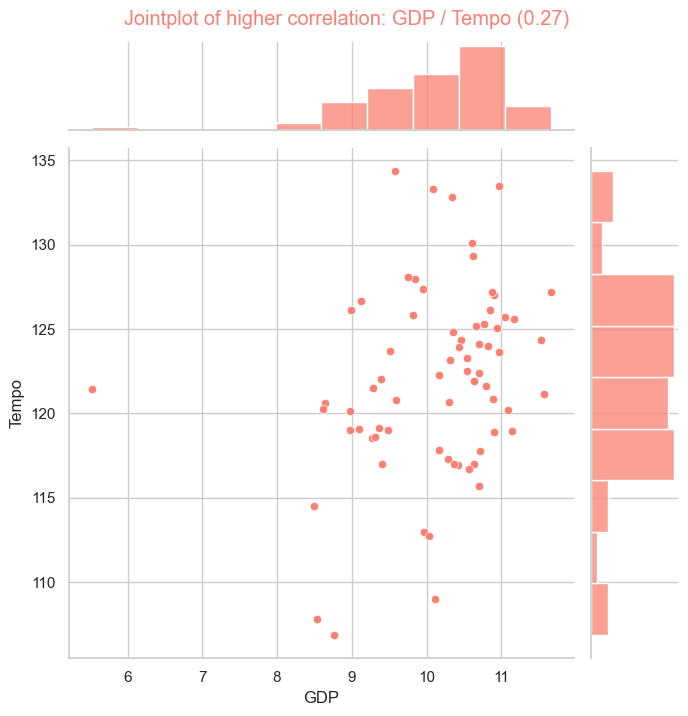

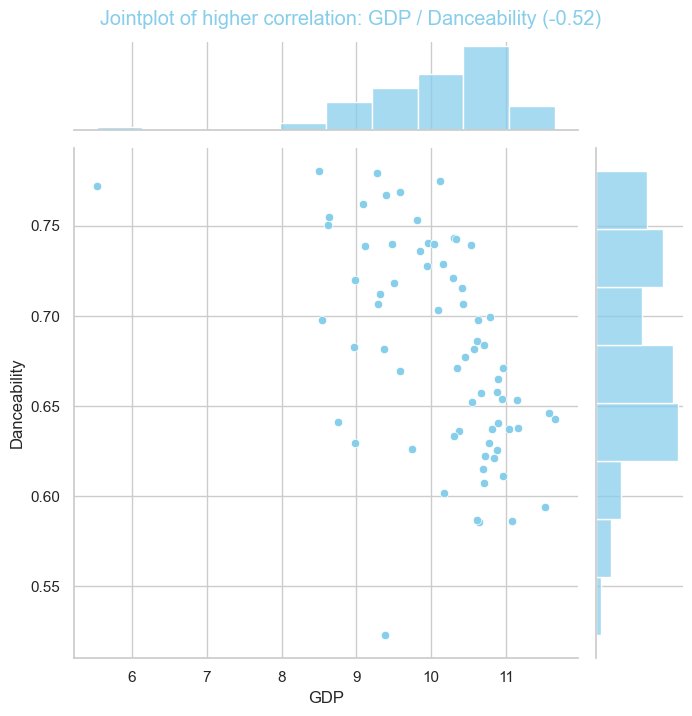

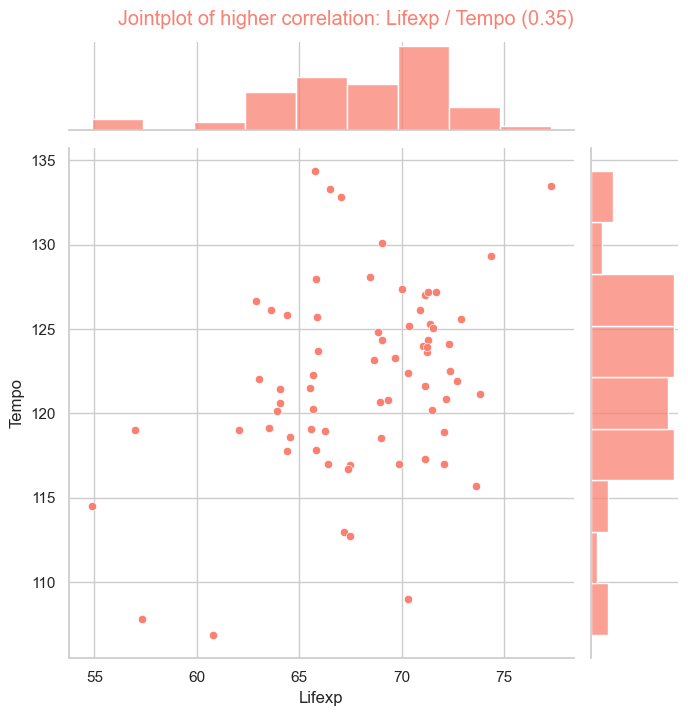

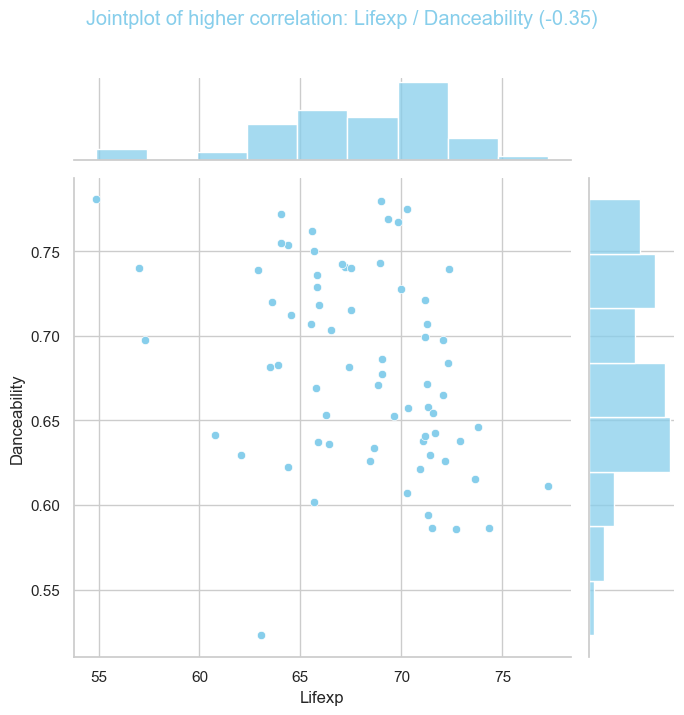

In [14]:
sns.set(style="whitegrid", palette="muted", color_codes=True)
sns.jointplot(data = df_without_songs_artists, x = 'Happiness', y = 'Tempo', color = 'salmon', kind='scatter', height = 7)
plt.suptitle('Jointplot of higher correlation: Happiness / Tempo (0.31)', color = 'Salmon', y=1.02)

sns.jointplot(data = df_without_songs_artists, x = 'Happiness', y = 'TSignature', color = 'skyblue', kind='scatter', height = 7)
plt.suptitle('Jointplot of higher correlation: Happiness / TSignature (-0.38)', color = 'skyblue', y=1.02)

sns.jointplot(data = df_without_songs_artists, x = 'GDP', y = 'Tempo', color = 'salmon', kind='scatter', height = 7)
plt.suptitle('Jointplot of higher correlation: GDP / Tempo (0.27)', color = 'Salmon', y=1.02)

sns.jointplot(data = df_without_songs_artists, x = 'GDP', y = 'Danceability', color = 'skyblue', kind='scatter', height = 7)
plt.suptitle('Jointplot of higher correlation: GDP / Danceability (-0.52)', color = 'skyblue', y=1.02)

sns.jointplot(data = df_without_songs_artists, x = 'Lifexp', y = 'Tempo', color = 'salmon', kind='scatter', height = 7)
plt.suptitle('Jointplot of higher correlation: Lifexp / Tempo (0.35)', color = 'Salmon', y=1.02)

sns.jointplot(data = df_without_songs_artists, x = 'Lifexp', y = 'Danceability', color = 'skyblue', kind='scatter', height = 7)
plt.suptitle('Jointplot of higher correlation: Lifexp / Danceability (-0.35)', color = 'skyblue', y=1.02)

plt.tight_layout()
plt.show()

### How do countries relate with each other in terms of songs?
Now, let's see how countries interact with others. 

To achieve this, we will plot a graph using the NetworkX python library (https://networkx.org/). Countries will be the source, and tracks will be the target. A node will be created for every country and song, and the edges will relate countries based on the songs they share.

For example: If Norway's Top-50 playlist has 'Song A' and 'Song B' in it. Italy's Top-50 has them too. Both Norway and Italy will be closer on the map.

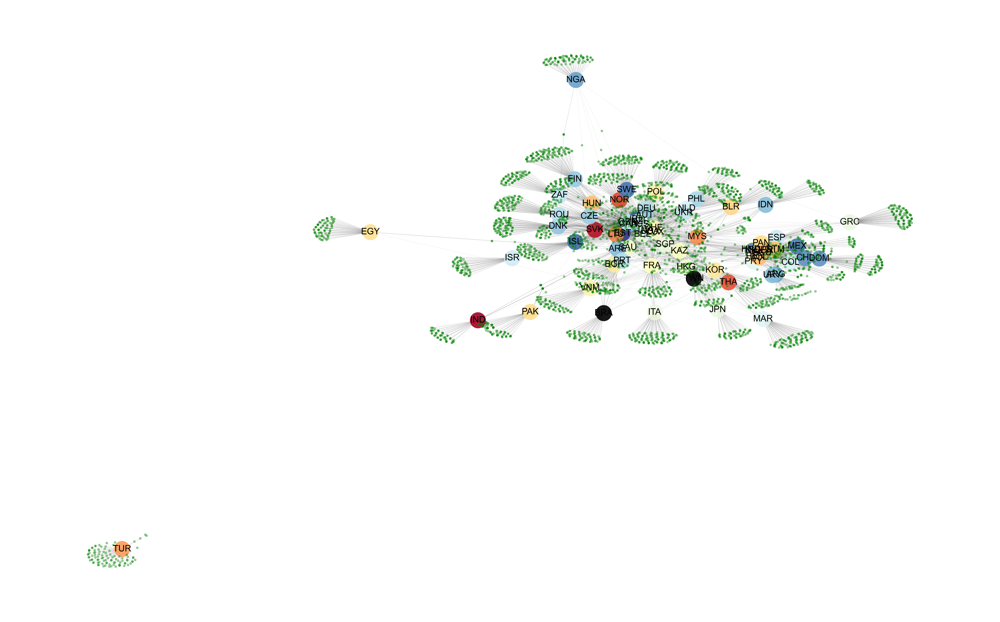

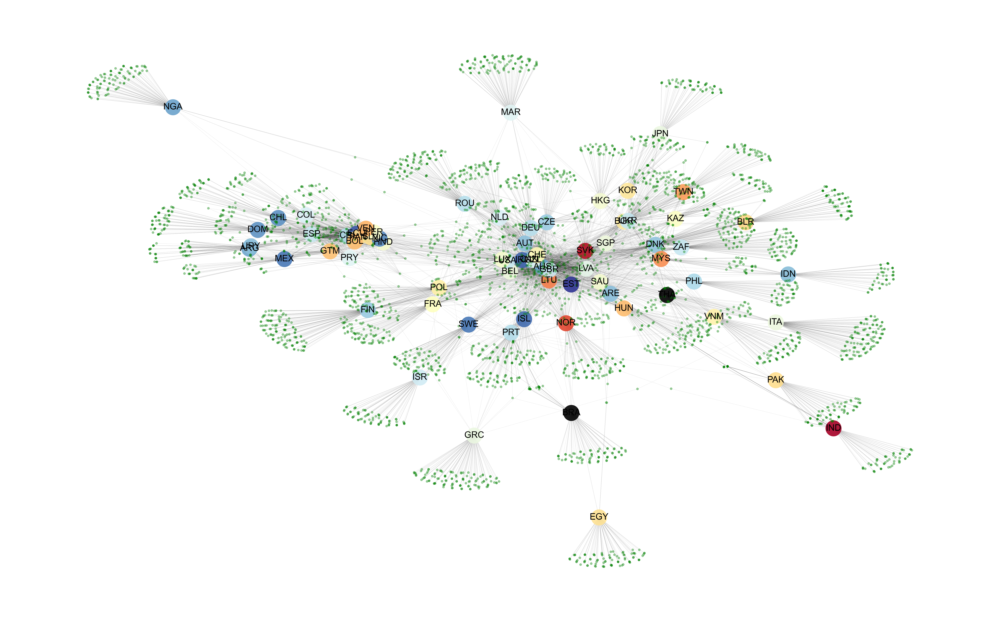

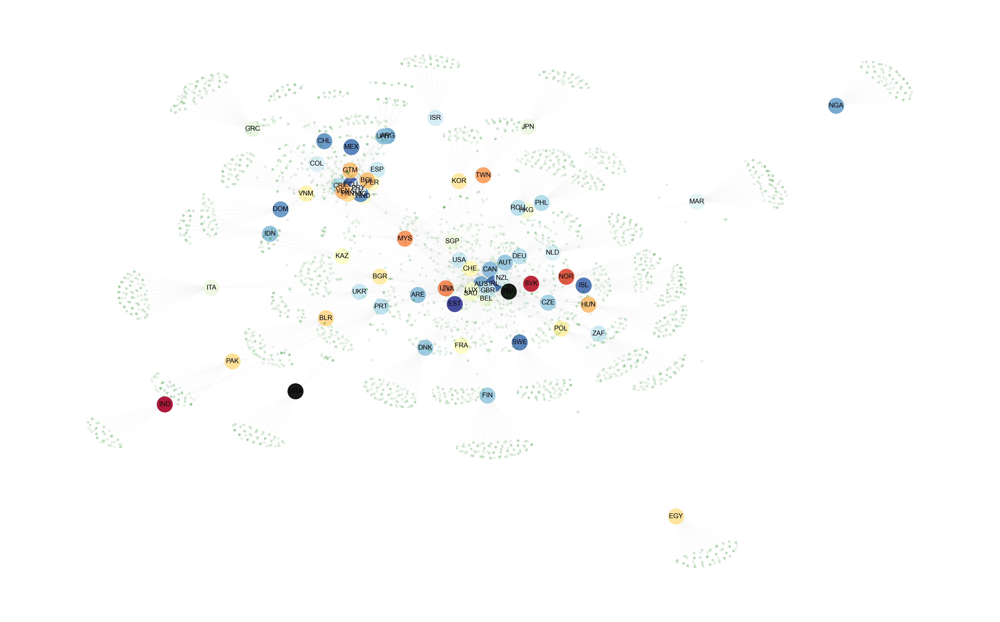

In [15]:
import networkx as nx
from networkx.drawing.nx_agraph import graphviz_layout

happiness_values = df_proj.groupby('Country')['Happiness'].mean().tolist()
norm = plt.Normalize(vmin=min(happiness_values), vmax=max(happiness_values))
cmap = plt.colormaps.get_cmap("RdYlBu")

G = nx.Graph()
country_nodes = df_proj['Country'].unique().tolist()
track_nodes = df_proj['Track Name'].unique().tolist()
G.add_nodes_from(country_nodes)
G.add_nodes_from(track_nodes)

edges_list = [(country, track) for country, track in zip(df_proj['Country'], df_proj['Track Name'])]

G.add_edges_from(edges_list)

plt.figure(figsize=(80,50))
pos = nx.spring_layout(G)

nx.draw_networkx_edges(G, pos, width=0.1)

country_colors = []
for happiness in happiness_values:
    if happiness is None:
        country_colors.append('#fefec0')
    else:
        country_colors.append(cmap(norm(happiness)))
        
track_colors = ['green' for _ in track_nodes]
node_colors = country_colors + track_colors

country_size = [5000 for _ in country_nodes]
track_size = [100 for _ in track_nodes]
node_size = country_size + track_size

country_alpha = [0.9 for _ in country_nodes]
track_alpha = [0.4 for _ in track_nodes]
node_alpha = country_alpha + track_alpha

nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=node_size, alpha = node_alpha)

country_labels = {country: country for country in df_proj['Country']}
nx.draw_networkx_labels(G, pos, labels=country_labels, font_size=40, font_color='black')
plt.axis('off')
plt.show()

# Second GRAPH: Without Turkey. We drop Turkey from the plot because it does not have any shared song with other countries.
import networkx as nx
from networkx.drawing.nx_agraph import graphviz_layout

df_proj = df_proj[df_proj['Country'] != 'TUR']
happiness_values = df_proj.groupby('Country')['Happiness'].mean().tolist()
norm = plt.Normalize(vmin=min(happiness_values), vmax=max(happiness_values))
cmap = plt.colormaps.get_cmap("RdYlBu")

G = nx.Graph()
country_nodes = df_proj['Country'].unique().tolist()
track_nodes = df_proj['Track Name'].unique().tolist()
G.add_nodes_from(country_nodes)
G.add_nodes_from(track_nodes)

edges_list = [(country, track) for country, track in zip(df_proj['Country'], df_proj['Track Name'])]

G.add_edges_from(edges_list)

plt.figure(figsize=(80,50))
pos = nx.spring_layout(G)

nx.draw_networkx_edges(G, pos, width=0.1)

country_colors = []
for happiness in happiness_values:
    if happiness is None:
        country_colors.append('#fefec0')
    else:
        country_colors.append(cmap(norm(happiness)))
        
track_colors = ['green' for _ in track_nodes]
node_colors = country_colors + track_colors

country_size = [5000 for _ in country_nodes]
track_size = [100 for _ in track_nodes]
node_size = country_size + track_size

country_alpha = [0.9 for _ in country_nodes]
track_alpha = [0.4 for _ in track_nodes]
node_alpha = country_alpha + track_alpha

nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=node_size, alpha = node_alpha)

country_labels = {country: country for country in df_proj['Country']}
nx.draw_networkx_labels(G, pos, labels=country_labels, font_size=40, font_color='black')
plt.axis('off')
plt.show()

# Third graph: Adjusting aesthetic details.
import networkx as nx
from networkx.drawing.nx_agraph import graphviz_layout

happiness_values = df_proj.groupby('Country')['Happiness'].mean().tolist()
norm = plt.Normalize(vmin=min(happiness_values), vmax=max(happiness_values))
cmap = plt.colormaps.get_cmap("RdYlBu")

G = nx.Graph()
country_nodes = df_proj['Country'].unique().tolist()
track_nodes = df_proj['Track Name'].unique().tolist()
G.add_nodes_from(country_nodes)
G.add_nodes_from(track_nodes)

edges_list = [(country, track) for country, track in zip(df_proj['Country'], df_proj['Track Name'])]

G.add_edges_from(edges_list)

plt.figure(figsize=(80,50))
pos = nx.spring_layout(G)

nx.draw_networkx_edges(G, pos, width=0.01)

country_colors = []
for happiness in happiness_values:
    if happiness is None:
        country_colors.append('#fefec0')
    else:
        country_colors.append(cmap(norm(happiness)))
        
track_colors = ['green' for _ in track_nodes]
node_colors = country_colors + track_colors

country_size = [5000 for _ in country_nodes]
track_size = [100 for _ in track_nodes]
node_size = country_size + track_size

country_alpha = [0.9 for _ in country_nodes]
track_alpha = [0.1 for _ in track_nodes]
node_alpha = country_alpha + track_alpha

nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=node_size, alpha = node_alpha)

country_labels = {country: country for country in df_proj['Country']}
nx.draw_networkx_labels(G, pos, labels=country_labels, font_size=30, font_color='black')
plt.axis('off')
plt.show()

### Once we have the final graph it is time to find communities.
One of the most important conclusions of a graph comes when observing the communities. Once we have the countries grouped, we have to check the communities formed and study them.

In this case, we will check the communities to try to see if they have any relation to the Happiness Score, or with audio features.

In [16]:
from networkx.algorithms import community

# Create the mapping from country names to integers to use greedy modularity for community detection.
node_to_int = {node: i for i, node in enumerate(G.nodes())}

G_int = nx.relabel_nodes(G, node_to_int)

# Find communities with greedy_modularity_communities.
communities = community.greedy_modularity_communities(G_int)

communities_final = {}
indexator = 1
for i, com in enumerate(communities):
    # Convert the nodes back to country names.
    community = [list(node_to_int.keys())[list(node_to_int.values()).index(node)] for node in com]
    countries_community = [node for node in community if node in country_nodes]
    
    # We add communities with more than 1 country to our communities_final dictionary. We can state that a community of 1 is not notable.
    if len(countries_community) > 1:
        communities_final[indexator] = countries_community
        indexator +=1

print(communities_final)

{1: ['DEU', 'SAU', 'AUT', 'AUS', 'BEL', 'CAN', 'ARE', 'SVK', 'USA', 'EST', 'PHL', 'IDN', 'IRL', 'LVA', 'LTU', 'LUX', 'MYS', 'NZL', 'GBR', 'CHE', 'SGP'], 2: ['ARG', 'CHL', 'COL', 'CRI', 'ECU', 'SLV', 'ESP', 'GTM', 'HND', 'DOM', 'MEX', 'NIC', 'PAN', 'PRY', 'PER', 'URY', 'VEN', 'BOL'], 3: ['KOR', 'HKG', 'JPN', 'THA', 'TWN', 'VNM'], 4: ['BLR', 'KAZ', 'UKR'], 5: ['NOR', 'SWE'], 6: ['NGA', 'ZAF'], 7: ['BRA', 'PRT'], 8: ['IND', 'PAK']}


### Let's analyze the communities.

Now we got 8 different communities. We will plot them on a world map to see visual connections, and then we will study the mean value of every audio feature for each community. It will be great to see if there exists any relation between the group and the Happiness Score.

{1: ['DEU', 'SAU', 'AUT', 'AUS', 'BEL', 'CAN', 'ARE', 'SVK', 'USA', 'EST', 'PHL', 'IDN', 'IRL', 'LVA', 'LTU', 'LUX', 'MYS', 'NZL', 'GBR', 'CHE', 'SGP'], 2: ['ARG', 'CHL', 'COL', 'CRI', 'ECU', 'SLV', 'ESP', 'GTM', 'HND', 'DOM', 'MEX', 'NIC', 'PAN', 'PRY', 'PER', 'URY', 'VEN', 'BOL'], 3: ['KOR', 'HKG', 'JPN', 'THA', 'TWN', 'VNM'], 4: ['BLR', 'KAZ', 'UKR'], 5: ['NOR', 'SWE'], 6: ['NGA', 'ZAF'], 7: ['BRA', 'PRT'], 8: ['IND', 'PAK']}


C:\Users\user\AppData\Local\Temp\ipykernel_1324\390688086.py:9: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


<Figure size 1200x800 with 0 Axes>

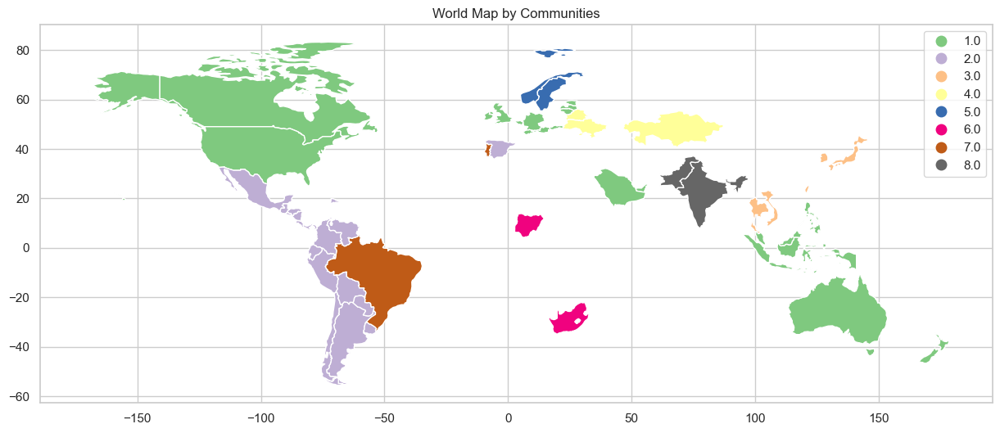

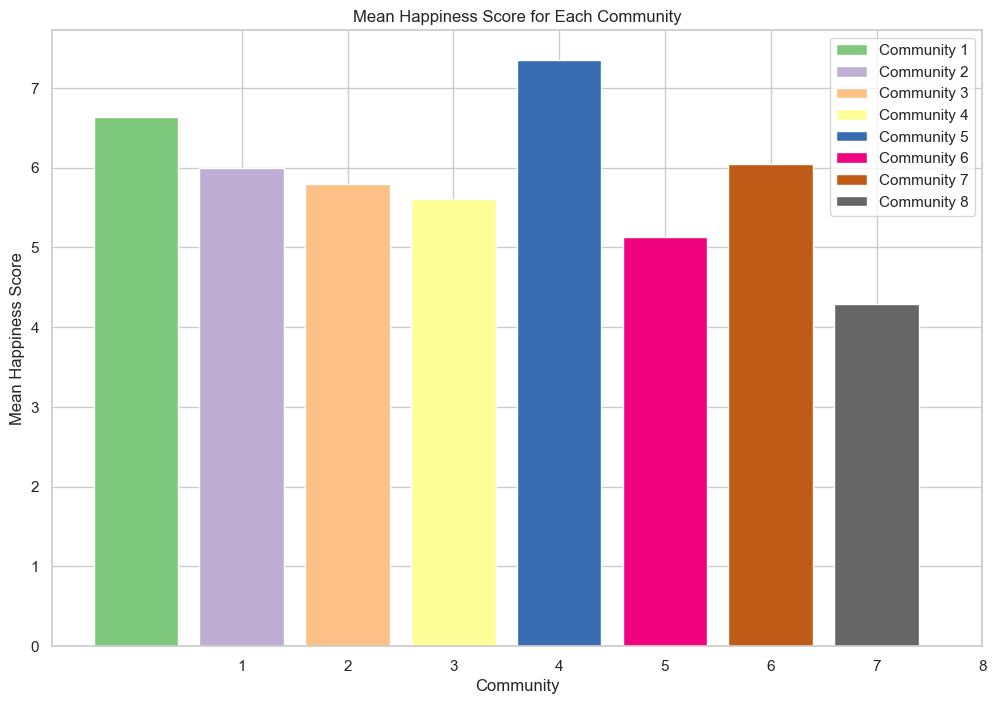

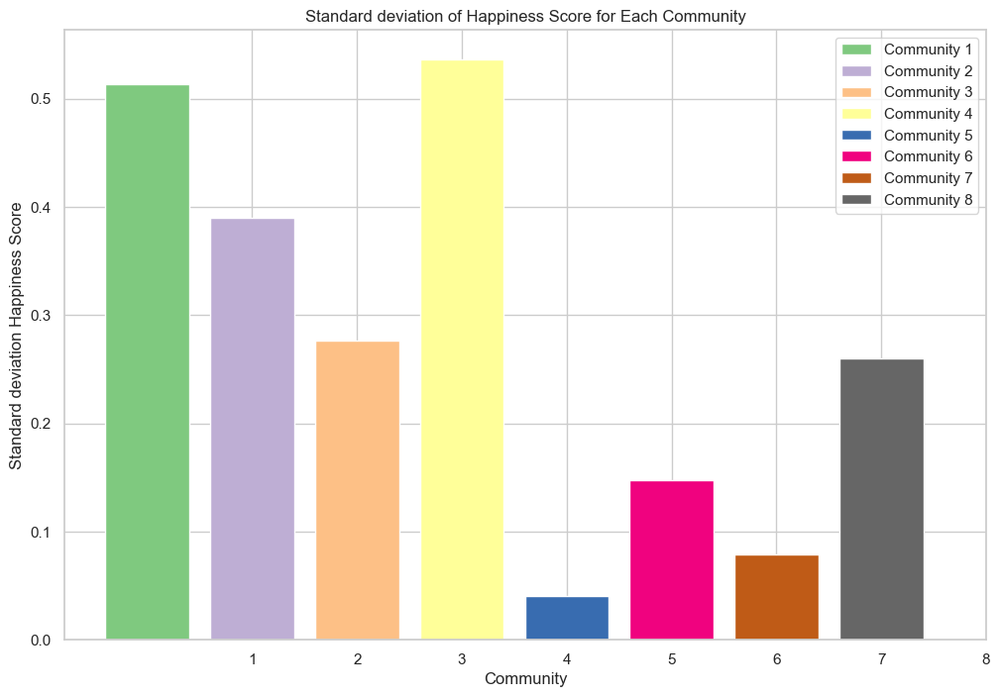

In [17]:
import geopandas as gpd
import matplotlib.pyplot as plt
print(communities_final)


cmap = 'Accent'
plt.figure(figsize=(12,8))

world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

communities_expanded = [(country, community) for community, countries in communities_final.items() for country in countries]
communities_df = pd.DataFrame(communities_expanded, columns=['Country', 'Community'])

# Merge world shapefile with communities data
world_with_communities = world.merge(communities_df, how='left', left_on='iso_a3', right_on='Country')

# Plot the map
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
world_with_communities.plot(column='Community', categorical=True, legend=True, ax=ax, cmap=cmap)
plt.title('World Map by Communities')
plt.show()


plt.figure(figsize=(12, 8))

for i, values in enumerate(communities_final.values()):
    df_com = df_proj[df_proj['Country'].isin(values)]
    mean = df_com['Happiness'].mean()
    plt.bar(i, mean, label = f'Community {i+1}', color=plt.get_cmap(cmap)(i))

plt.xlabel('Community')
plt.ylabel('Mean Happiness Score')
plt.title('Mean Happiness Score for Each Community')
plt.xticks(range(1, len(communities_final)+1))
plt.legend()
plt.show()   

plt.figure(figsize=(12, 8))

for i, values in enumerate(communities_final.values()):
    df_com = df_proj[df_proj['Country'].isin(values)]
    sd = df_com['Happiness'].std()
    plt.bar(i, sd, label = f'Community {i+1}', color=plt.get_cmap(cmap)(i))

plt.xlabel('Community')
plt.ylabel('Standard deviation Happiness Score')
plt.title('Standard deviation of Happiness Score for Each Community')
plt.xticks(range(1, len(communities_final)+1))
plt.legend()
plt.show()   

### Higher and Lower Happiness Score comparison.

At this point, we are going to compare the 2 highest communities (1 and 5) with the 2 lowest (6 and 8) when it comes to the Happiness Score.

This will help us to see the difference of audio features between highest and lowest countries in Happiness Score.

*Note: To scale the values, every column is divided by its highest value.*

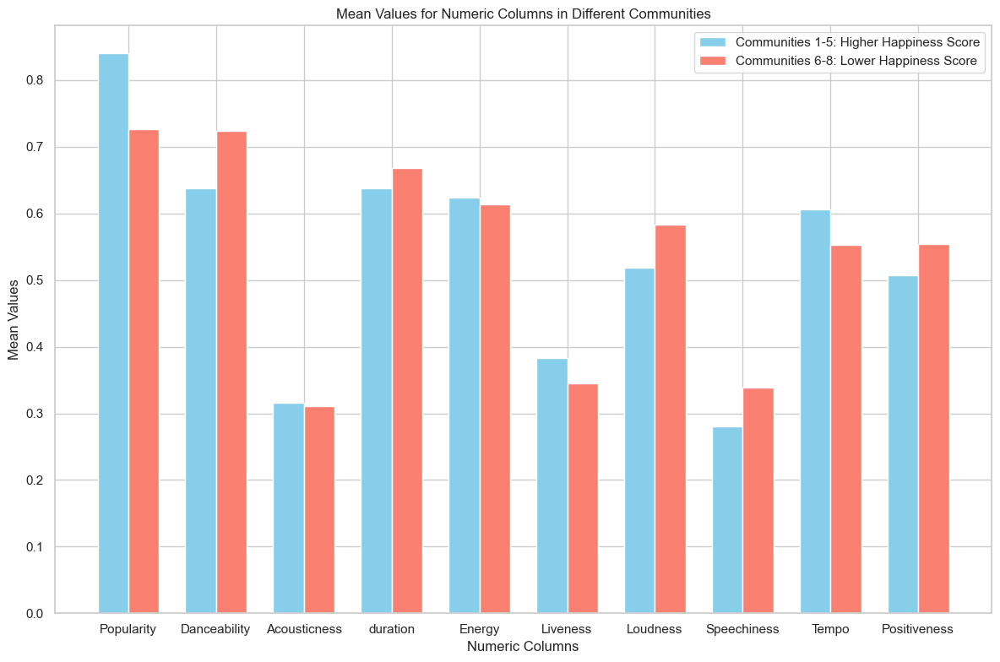

In [18]:
# Normalize every column before plotting the graph.
for column in numeric_columns:
    df_proj[column] = abs(df_proj[column]) / abs(df_proj[column]).max()
    
countries_community_6_8 = communities_final[6] + communities_final[8]
df_community_6_8 = df_proj[df_proj['Country'].isin(countries_community_6_8)]
mean_values_community_6_8 = df_community_6_8[numeric_columns].mean()

countries_community_1_5 = communities_final[1] + communities_final[5]
df_community_1_5 = df_proj[df_proj['Country'].isin(countries_community_1_5)]
mean_values_community_1_5 = df_community_1_5[numeric_columns].mean()

plt.figure(figsize=(12, 8))
bar_width = 0.35
x = range(len(numeric_columns))
plt.bar(x, mean_values_community_1_5, width=bar_width, label='Communities 1-5: Higher Happiness Score', color = 'skyblue')
plt.bar([i + bar_width for i in x], mean_values_community_6_8, width=bar_width, label='Communities 6-8: Lower Happiness Score', color = 'salmon')

# Set labels and title
plt.xlabel('Numeric Columns')
plt.ylabel('Mean Values')
plt.title('Mean Values for Numeric Columns in Different Communities')
plt.xticks([i + bar_width / 2 for i in x], numeric_columns)
plt.legend()
plt.tight_layout()
plt.show()

# Conclusions

### The difference between communities
As we see, there are some remarkable differences between the 2 groups we created. Let's analyze them one by one. From now on, the group with the highest Happiness Score will be called "HighH", and the group with the lowest Happiness Score will be called "LowH".
- **Popularity**: To Spotify, the music in HighH is 10 points more popular than LowH.
- **Danceability**: Songs in LowH are 8 points more danceable than the ones in HighH.
- **Acousticness**: Seeing the plot, we can state that there is no apparently difference between the groups when it comes to acousticness.
- **Duration**: Tracks in LowH are slightly longer than the ones in HighH.
- **Energy**: Apparently, there is no remarkable difference between the track energy in HighH and LowH.
- **Liveness**: Music in HighH has a higher component of liveness than the music in LowH.
- **Loudness**: Songs in LowH are 8 points louder than the ones in HighH.
- **Speechiness**: The difference of speechiness between LowH and HighH is 6 points to LowH.
- **Tempo**: Tracks in HighH are 5 points higher in Tempo than the ones in LowH.
- **Positiveness**: Music in LowH is 5 points more positive than it is in HighH.

### Overall

To conclude the notebook, our analysis reveals distinct differences between the HighH and LowH groups across various music attributes. While HighH exhibits higher popularity, liveness, and tempo, LowH demonstrates greater danceability and loudness. However, both groups show minimal disparities in acousticness, energy, and positiveness. 

The relations between countries do not depend on happiness nor GDP per capita. They depend on the language spoken and proximity.